In [1]:
pip install langdetect

Note: you may need to restart the kernel to use updated packages.


In [2]:
import pandas as pd
from langdetect import detect
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
import seaborn as sns; sns.set()
import csv

## CLEANING DATA:

#### REVIEW DATA:

In [3]:
df_reviews = pd.read_csv('reviews.csv')

print(df_reviews.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 243183 entries, 0 to 243182
Data columns (total 6 columns):
 #   Column         Non-Null Count   Dtype 
---  ------         --------------   ----- 
 0   listing_id     243183 non-null  int64 
 1   id             243183 non-null  int64 
 2   date           243183 non-null  object
 3   reviewer_id    243183 non-null  int64 
 4   reviewer_name  243183 non-null  object
 5   comments       243165 non-null  object
dtypes: int64(3), object(3)
memory usage: 11.1+ MB
None


In [4]:
clean_reviews = df_reviews.drop(["date", "reviewer_name"], axis=1)
print(clean_reviews.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 243183 entries, 0 to 243182
Data columns (total 4 columns):
 #   Column       Non-Null Count   Dtype 
---  ------       --------------   ----- 
 0   listing_id   243183 non-null  int64 
 1   id           243183 non-null  int64 
 2   reviewer_id  243183 non-null  int64 
 3   comments     243165 non-null  object
dtypes: int64(3), object(1)
memory usage: 7.4+ MB
None


In [5]:
clean_reviews['comments'] = clean_reviews['comments'].str.lower()
print(clean_reviews.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 243183 entries, 0 to 243182
Data columns (total 4 columns):
 #   Column       Non-Null Count   Dtype 
---  ------       --------------   ----- 
 0   listing_id   243183 non-null  int64 
 1   id           243183 non-null  int64 
 2   reviewer_id  243183 non-null  int64 
 3   comments     243165 non-null  object
dtypes: int64(3), object(1)
memory usage: 7.4+ MB
None


In [6]:
def det(x):
    try:
        return detect(x)
    except:
        return 'unknown'

clean_reviews['Lang'] = clean_reviews['comments'].apply(det)
clean_reviews.head()

,listing_id,id,reviewer_id,comments,Lang
0,44077,203703,393348,we enjoyed our stay very much. the room was co...,en
1,44077,211369,444004,we have been here 4 nights. stay in a home is ...,en
2,44077,234215,465058,teresa and hughie were great hosts. they were ...,en
3,44077,261843,490005,"no surprises, was as described. very gracious...",en
4,44077,268148,520460,"teresa was a lovely hostess, and we had a deli...",en


In [7]:
clean_reviews = clean_reviews[clean_reviews["Lang"] == "en"].drop(["Lang"], axis=1)

In [8]:
print(clean_reviews.info())

<class 'pandas.core.frame.DataFrame'>
Int64Index: 208976 entries, 0 to 243182
Data columns (total 4 columns):
 #   Column       Non-Null Count   Dtype 
---  ------       --------------   ----- 
 0   listing_id   208976 non-null  int64 
 1   id           208976 non-null  int64 
 2   reviewer_id  208976 non-null  int64 
 3   comments     208976 non-null  object
dtypes: int64(3), object(1)
memory usage: 8.0+ MB
None


In [9]:
clean_reviews.to_csv('clean_review.csv',index = False)

In [10]:
clean_reviews = pd.read_csv('clean_review.csv')
# clean_reviews = clean_reviews[['listing_id', 'comments']]
clean_reviews.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 208976 entries, 0 to 208975
Data columns (total 4 columns):
 #   Column       Non-Null Count   Dtype 
---  ------       --------------   ----- 
 0   listing_id   208976 non-null  int64 
 1   id           208976 non-null  int64 
 2   reviewer_id  208976 non-null  int64 
 3   comments     208976 non-null  object
dtypes: int64(3), object(1)
memory usage: 6.4+ MB


In [11]:
pip install vaderSentiment

Note: you may need to restart the kernel to use updated packages.


In [12]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.svm import LinearSVC
from sklearn.model_selection import train_test_split
import seaborn as sns
from sklearn.model_selection import cross_val_predict
from sklearn.linear_model import LogisticRegression
import matplotlib.patches as mpatches
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
import csv

In [13]:
c = clean_reviews.loc[:,'comments']
print(c.head())

0    we enjoyed our stay very much. the room was co...
1    we have been here 4 nights. stay in a home is ...
2    teresa and hughie were great hosts. they were ...
3    no surprises, was as described.  very gracious...
4    teresa was a lovely hostess, and we had a deli...
Name: comments, dtype: object


In [14]:

sid_obj = SentimentIntensityAnalyzer()
count = 0
sent = []
for a in c:
  n = sid_obj.polarity_scores(a)
  count = count+1
  sent.append(n['compound'])
print(count)


208976


In [29]:
clean_reviews['Sentiment']= sent
print(clean_reviews.info())
# reviews=pd.read_csv('./clean_reviews.csv')
# reviews.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 208976 entries, 0 to 208956
Data columns (total 6 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   listing_id   208976 non-null  int64  
 1   id           208976 non-null  int64  
 2   reviewer_id  208976 non-null  int64  
 3   comments     208976 non-null  object 
 4   sentiment    208976 non-null  float64
 5   Sentiment    208976 non-null  float64
dtypes: float64(2), int64(3), object(1)
memory usage: 21.2+ MB
None


In [30]:
clean_reviews.to_csv('clean_review.csv',index = False)
clean_reviews = pd.read_csv('clean_review.csv')
print(clean_reviews.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 208976 entries, 0 to 208975
Data columns (total 6 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   listing_id   208976 non-null  int64  
 1   id           208976 non-null  int64  
 2   reviewer_id  208976 non-null  int64  
 3   comments     208976 non-null  object 
 4   sentiment    208976 non-null  float64
 5   Sentiment    208976 non-null  float64
dtypes: float64(2), int64(3), object(1)
memory usage: 9.6+ MB
None


In [31]:
clean_reviews = clean_reviews.sort_values('listing_id')
print(clean_reviews.info())

<class 'pandas.core.frame.DataFrame'>
Int64Index: 208976 entries, 0 to 208975
Data columns (total 6 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   listing_id   208976 non-null  int64  
 1   id           208976 non-null  int64  
 2   reviewer_id  208976 non-null  int64  
 3   comments     208976 non-null  object 
 4   sentiment    208976 non-null  float64
 5   Sentiment    208976 non-null  float64
dtypes: float64(2), int64(3), object(1)
memory usage: 11.2+ MB
None


In [32]:
l = clean_reviews.loc[:,'listing_id']
s = clean_reviews.loc[:,'sentiment']

print(l.size)

new_sen = []
new_id = [] 
idx = 0
i = 0

while(i<l.size):
    cnt = 0
    sum = 0
    id = l[i]
    new_id.append(id)

    # while( i<l.size):
        # print("HERE")
    while( i<l.size and l[i]==id ):
        cnt = cnt + 1
        sum = sum + s[i]
        i = i + 1
        print(str(id) + " Count = "+ str(cnt))

    # print("HERE: "+ str(l[i])+ " "+str(id))
    
    new_sen.append(round((sum/cnt),5))
    print("ID:" + str(new_id[idx]) + " SEN:" + str(new_sen[idx]) + " SUM:" + str(sum))
    print("------------------")
    idx = idx + 1


208976
44077 Count = 1
44077 Count = 2
44077 Count = 3
44077 Count = 4
44077 Count = 5
44077 Count = 6
44077 Count = 7
44077 Count = 8
44077 Count = 9
44077 Count = 10
44077 Count = 11
44077 Count = 12
44077 Count = 13
44077 Count = 14
44077 Count = 15
44077 Count = 16
44077 Count = 17
44077 Count = 18
44077 Count = 19
44077 Count = 20
44077 Count = 21
44077 Count = 22
44077 Count = 23
44077 Count = 24
44077 Count = 25
44077 Count = 26
44077 Count = 27
44077 Count = 28
44077 Count = 29
44077 Count = 30
44077 Count = 31
44077 Count = 32
44077 Count = 33
44077 Count = 34
44077 Count = 35
44077 Count = 36
44077 Count = 37
44077 Count = 38
44077 Count = 39
44077 Count = 40
44077 Count = 41
44077 Count = 42
44077 Count = 43
44077 Count = 44
44077 Count = 45
44077 Count = 46
44077 Count = 47
44077 Count = 48
44077 Count = 49
44077 Count = 50
44077 Count = 51
44077 Count = 52
44077 Count = 53
44077 Count = 54
44077 Count = 55
44077 Count = 56
44077 Count = 57
44077 Count = 58
44077 Count = 59

In [33]:
l = clean_reviews.loc[:,'listing_id']
c = clean_reviews.loc[:,'comments']

new_comm = []
temp_id = []
idx = 0
i = 0

while(i<l.size):
    cnt = 0
    all_comm = " "
    id = l[i]
    temp_id.append(id)

    # while( i<l.size):
        # print("HERE")
    while( i<l.size and l[i]==id ):
        cnt = cnt + 1
        all_comm = all_comm + c[i]
        i = i + 1
        print(str(id) + " Count = "+ str(cnt))

    # print("HERE: "+ str(l[i])+ " "+str(id))
    
    new_comm.append(all_comm)
    print("ID:" + str(temp_id[idx]) + " LENGTH:" + str(len(all_comm)))
    print("------------------")
    idx = idx + 1

44077 Count = 1
44077 Count = 2
44077 Count = 3
44077 Count = 4
44077 Count = 5
44077 Count = 6
44077 Count = 7
44077 Count = 8
44077 Count = 9
44077 Count = 10
44077 Count = 11
44077 Count = 12
44077 Count = 13
44077 Count = 14
44077 Count = 15
44077 Count = 16
44077 Count = 17
44077 Count = 18
44077 Count = 19
44077 Count = 20
44077 Count = 21
44077 Count = 22
44077 Count = 23
44077 Count = 24
44077 Count = 25
44077 Count = 26
44077 Count = 27
44077 Count = 28
44077 Count = 29
44077 Count = 30
44077 Count = 31
44077 Count = 32
44077 Count = 33
44077 Count = 34
44077 Count = 35
44077 Count = 36
44077 Count = 37
44077 Count = 38
44077 Count = 39
44077 Count = 40
44077 Count = 41
44077 Count = 42
44077 Count = 43
44077 Count = 44
44077 Count = 45
44077 Count = 46
44077 Count = 47
44077 Count = 48
44077 Count = 49
44077 Count = 50
44077 Count = 51
44077 Count = 52
44077 Count = 53
44077 Count = 54
44077 Count = 55
44077 Count = 56
44077 Count = 57
44077 Count = 58
44077 Count = 59
44077 

In [34]:
print(len(new_sen),len(new_id),len(new_comm))
# new_comm[0]

final_reviews = pd.DataFrame({'id':new_id, 'comments':new_comm, 'sentiment': new_sen})
final_reviews.shape


6096 6096 6096


(6096, 3)

In [35]:
final_reviews.to_csv('final_reviews.csv',index = False)
final_reviews = pd.read_csv('final_reviews.csv')
final_reviews.shape

(6096, 3)

#### LISTING DATA:

In [173]:
df_listing = pd.read_csv('listings.csv')
df_listing.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7566 entries, 0 to 7565
Data columns (total 75 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   id                                            7566 non-null   int64  
 1   listing_url                                   7566 non-null   object 
 2   scrape_id                                     7566 non-null   int64  
 3   last_scraped                                  7566 non-null   object 
 4   source                                        7566 non-null   object 
 5   name                                          7566 non-null   object 
 6   description                                   7411 non-null   object 
 7   neighborhood_overview                         4194 non-null   object 
 8   picture_url                                   7566 non-null   object 
 9   host_id                                       7566 non-null   i

In [174]:
df_listing=df_listing.drop(["listing_url", "scrape_id", "last_scraped", "source", "name", "picture_url", "host_id", "host_name", "host_url",
"host_thumbnail_url", "host_picture_url", "neighbourhood_group_cleansed", "bathrooms", "license", "host_location", "host_since","first_review","last_review"], axis=1)

df_listing = df_listing.drop(['neighbourhood', 'neighbourhood_cleansed','calendar_updated','calendar_last_scraped'],axis=1)

df_listing = df_listing.drop(['minimum_minimum_nights', 'maximum_minimum_nights', 'minimum_maximum_nights', 'maximum_maximum_nights', 'minimum_nights_avg_ntm', 'maximum_nights_avg_ntm'],axis=1)

df_listing = df_listing.drop(['neighborhood_overview', 'host_about', 'host_response_time', 'host_acceptance_rate','host_neighbourhood'],axis=1) 

df_listing.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7566 entries, 0 to 7565
Data columns (total 42 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   id                                            7566 non-null   int64  
 1   description                                   7411 non-null   object 
 2   host_response_rate                            3932 non-null   object 
 3   host_is_superhost                             7566 non-null   object 
 4   host_listings_count                           7566 non-null   int64  
 5   host_total_listings_count                     7566 non-null   int64  
 6   host_verifications                            7566 non-null   object 
 7   host_has_profile_pic                          7566 non-null   object 
 8   host_identity_verified                        7566 non-null   object 
 9   latitude                                      7566 non-null   f

In [175]:
df_listing.columns.size

42

In [176]:
X=df_listing.loc[:,['id','latitude','longitude']]
df_listing = df_listing.drop(['latitude', 'longitude'],axis=1)


X.head(10)

,id,latitude,longitude
0,44077,53.29178,-6.25792
1,85156,53.29209,-6.25624
2,159889,53.39027,-6.23547
3,162809,53.28326,-6.19188
4,165828,53.33744,-6.32363
5,165829,53.33744,-6.32363
6,178860,53.33281,-6.26750
7,181823,53.33740,-6.22061
8,237465,53.39558,-6.17524
9,245903,53.34636,-6.41734


In [177]:
kmeans = KMeans(n_clusters = 7, init ='k-means++')
kmeans.fit(X[X.columns[1:3]]) # Compute k-means clustering.
X['cluster_label'] = kmeans.fit_predict(X[X.columns[1:3]])
centers = kmeans.cluster_centers_ # Coordinates of cluster centers.
labels = kmeans.predict(X[X.columns[1:3]]) # Labels of each point
X.head(10)

,id,latitude,longitude,cluster_label
0,44077,53.29178,-6.25792,2
1,85156,53.29209,-6.25624,2
2,159889,53.39027,-6.23547,6
3,162809,53.28326,-6.19188,2
4,165828,53.33744,-6.32363,1
5,165829,53.33744,-6.32363,1
6,178860,53.33281,-6.26750,1
7,181823,53.33740,-6.22061,6
8,237465,53.39558,-6.17524,0
9,245903,53.34636,-6.41734,4


In [178]:
X = X.drop(['latitude', 'longitude'],axis=1)


df_listing = df_listing.merge(X, left_on='id', right_on='id')
# df_listing.head(5)

In [179]:
df_listing.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7566 entries, 0 to 7565
Data columns (total 41 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   id                                            7566 non-null   int64  
 1   description                                   7411 non-null   object 
 2   host_response_rate                            3932 non-null   object 
 3   host_is_superhost                             7566 non-null   object 
 4   host_listings_count                           7566 non-null   int64  
 5   host_total_listings_count                     7566 non-null   int64  
 6   host_verifications                            7566 non-null   object 
 7   host_has_profile_pic                          7566 non-null   object 
 8   host_identity_verified                        7566 non-null   object 
 9   property_type                                 7566 non-null   o

In [180]:
df_listing['host_response_rate'] = df_listing['host_response_rate'].str.replace('%', '')
df_listing['host_response_rate'] = df_listing['host_response_rate'].astype(float)

In [181]:
# df_temp = df_listing.copy
df_temp = df_listing.loc[:,['bedrooms','beds','host_response_rate','review_scores_rating','review_scores_accuracy','review_scores_cleanliness','review_scores_checkin','review_scores_communication','review_scores_location','review_scores_value','reviews_per_month']]

In [182]:
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.linear_model import LinearRegression

In [183]:
linear_regression = LinearRegression()
imp = IterativeImputer(estimator=linear_regression,missing_values=np.nan, max_iter=100, verbose=2, imputation_order='roman',random_state=0)
ImputedData=imp.fit_transform(df_temp)

[IterativeImputer] Completing matrix with shape (7566, 11)
[IterativeImputer] Ending imputation round 1/100, elapsed time 0.04
[IterativeImputer] Change: 22.170216921635216, scaled tolerance: 0.1 
[IterativeImputer] Ending imputation round 2/100, elapsed time 0.08
[IterativeImputer] Change: 50.301797078360266, scaled tolerance: 0.1 
[IterativeImputer] Ending imputation round 3/100, elapsed time 0.12
[IterativeImputer] Change: 26.31195014780026, scaled tolerance: 0.1 
[IterativeImputer] Ending imputation round 4/100, elapsed time 0.15
[IterativeImputer] Change: 6.909035622160019, scaled tolerance: 0.1 
[IterativeImputer] Ending imputation round 5/100, elapsed time 0.19
[IterativeImputer] Change: 4.064876686812681, scaled tolerance: 0.1 
[IterativeImputer] Ending imputation round 6/100, elapsed time 0.22
[IterativeImputer] Change: 4.750434901965235, scaled tolerance: 0.1 
[IterativeImputer] Ending imputation round 7/100, elapsed time 0.26
[IterativeImputer] Change: 4.164663240299177, sca

In [184]:
# df_temp['host_response_rate'].isna().sum()
ImputedData = pd.DataFrame(ImputedData)

In [185]:
!pip install miceforest missingpy
# pip install missingpy

In [186]:
from sklearn.impute import KNNImputer
knn = KNNImputer(n_neighbors=2)
ImputedData1 = knn.fit_transform(df_temp)
ImputedData1 = pd.DataFrame(ImputedData1)

In [187]:
arr = ['bedrooms','beds','host_response_rate','review_scores_rating','review_scores_accuracy','review_scores_cleanliness','review_scores_checkin','review_scores_communication','review_scores_location','review_scores_value','reviews_per_month']
i = 0

for ele in arr:
    mean_value_1 = round(df_temp[ele].mean(),3)
    mean_value_2 = round(ImputedData[i].mean(),3)
    mean_value_3 = round(ImputedData1[i].mean(),3)
    i=i+1

    print(mean_value_1,mean_value_2,mean_value_3)

1.524 1.516 1.513
1.833 1.829 1.831
94.378 92.578 86.094
4.603 4.596 4.629
4.777 4.71 4.731
4.646 4.549 4.607
4.829 4.779 4.793
4.844 4.793 4.808
4.732 4.693 4.704
4.615 4.537 4.578
1.319 1.308 1.406


c:\Users\Arnav\AppData\Local\Programs\Python\Python37\lib\site-packages\ipykernel_launcher.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  
c:\Users\Arnav\AppData\Local\Programs\Python\Python37\lib\site-packages\ipykernel_launcher.py:5: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  """
c:\Users\Arnav\AppData\Local\Pr

<AxesSubplot:xlabel='review_scores_value', ylabel='Density'>

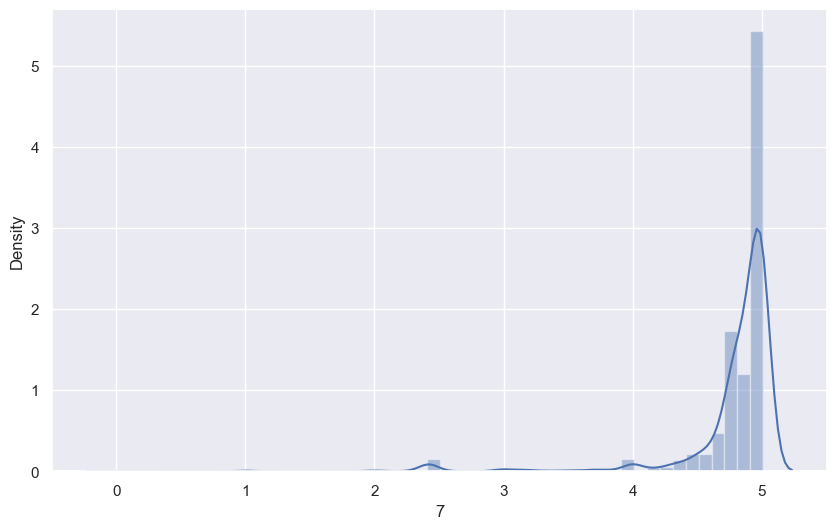

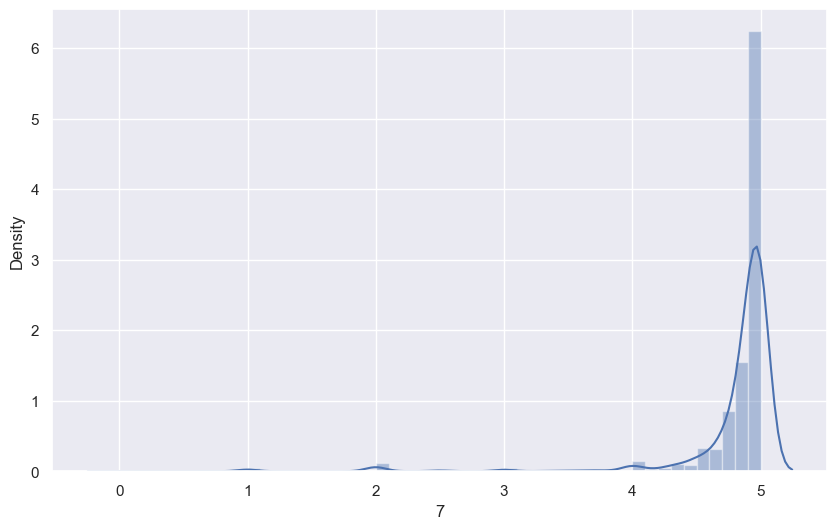

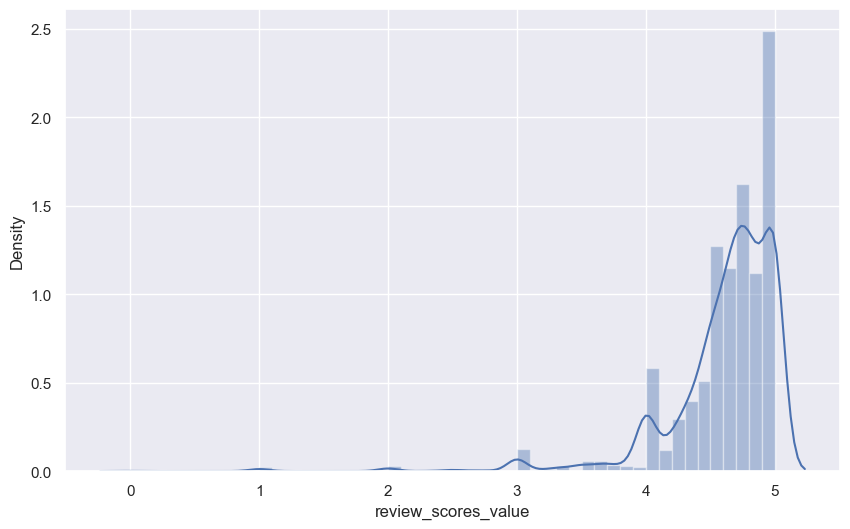

In [188]:
fig, ax = plt.subplots(figsize=(10,6))
sns.distplot(ImputedData[7])

fig, ax = plt.subplots(figsize=(10,6))
sns.distplot(ImputedData1[7])

fig, ax = plt.subplots(figsize=(10,6))
sns.distplot(df_temp.review_scores_value)

# ['host_response_rate','review_scores_rating','review_scores_accuracy','review_scores_cleanliness','review_scores_checkin',
# 'review_scores_communication','review_scores_location','review_scores_value']]

In [189]:
i = 0

for ele in arr:
    df_temp[ele] = ImputedData1[i]
    i=i+1

df_temp

,bedrooms,beds,host_response_rate,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,reviews_per_month
0,1.0,2.0,100.0,4.780,4.830,4.740,4.930,4.930,4.660,4.820,1.850
1,1.0,1.0,100.0,4.790,4.860,4.740,4.900,4.880,4.640,4.780,1.530
2,1.0,1.0,100.0,4.740,4.770,4.710,4.860,4.900,4.630,4.740,2.780
3,2.0,4.0,92.0,4.840,4.880,4.850,4.950,4.970,4.770,4.850,3.680
4,1.0,3.0,100.0,4.630,4.890,4.690,4.810,4.750,4.340,4.550,0.480
...,...,...,...,...,...,...,...,...,...,...,...
7561,1.0,1.0,100.0,4.765,4.815,4.725,4.880,4.890,4.635,4.760,2.155
7562,1.0,1.0,100.0,4.835,4.900,4.810,4.925,4.920,4.790,4.810,2.050
7563,2.0,2.0,100.0,4.900,4.935,4.885,4.955,4.975,4.825,4.775,3.285
7564,1.0,1.0,100.0,4.765,4.815,4.725,4.880,4.890,4.635,4.760,2.155


In [190]:
for ele in arr:
    df_listing[ele] = df_temp[ele]

df_listing.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7566 entries, 0 to 7565
Data columns (total 41 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   id                                            7566 non-null   int64  
 1   description                                   7411 non-null   object 
 2   host_response_rate                            7566 non-null   float64
 3   host_is_superhost                             7566 non-null   object 
 4   host_listings_count                           7566 non-null   int64  
 5   host_total_listings_count                     7566 non-null   int64  
 6   host_verifications                            7566 non-null   object 
 7   host_has_profile_pic                          7566 non-null   object 
 8   host_identity_verified                        7566 non-null   object 
 9   property_type                                 7566 non-null   o

In [191]:
X=df_listing.loc[:,['id','bathrooms_text']]
bathrooms_text_map = {'0 shared baths':1,
                      '0 baths': 1,
                      'Shared half-bath': 2,
                      'Half-bath':3,
                      'Private half-bath':4,
                      '1 shared bath':5,
                      '1 bath': 6,
                      '1 private bath': 7,
                      '1.5 baths': 9,
                      '1.5 shared baths': 8,
                      '2 shared baths':10,
                      '2 baths':11,
                      '2.5 shared baths': 12,
                      '2.5 baths': 13,
                      '3 shared baths': 14,
                      '3 baths': 15,
                      '3.5 shared baths': 16,
                      '3.5 baths': 17,
                      '4 shared baths': 18,
                      '4 baths': 19,
                      '4.5 baths': 20,
                      '5 baths': 21,
                      '5.5 baths': 22,
                      '6 shared baths': 23,
                      '6 baths': 24,
                      '6.5 baths': 25,
                      '7 baths': 26,
                      '7.5 baths': 27,
                      '8 baths': 28,
                      '8.5 baths': 29,
                      '9.5 baths': 30}

X['bathroom_map'] = X.bathrooms_text.map(bathrooms_text_map)
X.head()

,id,bathrooms_text,bathroom_map
0,44077,1.5 shared baths,8.0
1,85156,1.5 shared baths,8.0
2,159889,2 shared baths,10.0
3,162809,1.5 shared baths,8.0
4,165828,1 bath,6.0


In [192]:
df_listing = df_listing.drop(['bathrooms_text'], axis=1).merge(X, left_on='id', right_on='id')
df_listing['bathroom_map'] = df_listing['bathroom_map'].fillna(6)
df_listing = df_listing.drop(['bathrooms_text'], axis=1)
df_listing.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7566 entries, 0 to 7565
Data columns (total 41 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   id                                            7566 non-null   int64  
 1   description                                   7411 non-null   object 
 2   host_response_rate                            7566 non-null   float64
 3   host_is_superhost                             7566 non-null   object 
 4   host_listings_count                           7566 non-null   int64  
 5   host_total_listings_count                     7566 non-null   int64  
 6   host_verifications                            7566 non-null   object 
 7   host_has_profile_pic                          7566 non-null   object 
 8   host_identity_verified                        7566 non-null   object 
 9   property_type                                 7566 non-null   o

In [193]:
df_listing.to_csv('final_listing.csv',index = False)
final_listing = pd.read_csv('final_listing.csv')
final_listing.shape

(7566, 41)

In [194]:
import nltk
nltk.download('stopwords')
nltk.download('punkt')
nltk.download('wordnet')
nltk.download('omw-1.4')
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
import string


[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Arnav\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\Arnav\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\Arnav\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package omw-1.4 to
[nltk_data]     C:\Users\Arnav\AppData\Roaming\nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!


In [195]:
df_listings_final = pd.read_csv('final_listing.csv')

In [196]:
# convert text to lowercase.
import re

def convert_empty_to_nan( df, column_name ) :
    df[ column_name ] = df[ column_name ].str.lower()
    df[ column_name ] = df[ column_name ].fillna("NA") 
    df[ column_name ] = df[ column_name ].str.replace("[^a-zA-Z0-9]+", ' ', regex=True)
    # re.sub(r"[^a-zA-Z0-9]+", ' ', k)
    df[ column_name ] = df[ column_name ].str.replace('\d+', '', regex=True)
    #.replace(r'^\s*$', "No description", regeX=True)

convert_empty_to_nan( df_listings_final, 'description' )

# df_listings_final['description'].head()

# df_listings_final.to_csv( '../data/listingsDesc.csv', indeX=False )

In [197]:
# Removing stop words (un-necessary words) - using nltk's pre-defined stop words
STOP_WORDS = set( stopwords.words('english') )
STOP_WORDS.add("br")
# print('Stop word list:')
# print('----------------')
# print(STOP_WORDS)

def remove_stop_words(content):
   return " ".join([text for text in str(content).split() if text not in STOP_WORDS])

df_listings_final['description'] = df_listings_final['description'].apply(lambda content: remove_stop_words(content=content))

# df_listings_final['description'].head()

In [198]:
from nltk.stem import PorterStemmer
from nltk.tokenize import word_tokenize

ps = PorterStemmer()

def stemming(x):
    words = word_tokenize(x)

    for i in range(len(words)):
        words[i] = ps.stem(words[i])

    return (' '.join(map(str, words)))

df_listings_final['description'] = df_listings_final.apply(lambda row : stemming(row['description']), axis = 1)
df_listings_final.description.head()

0    hous built plenti land origin dundrum consid s...
1    cottag charm light fill cottag vibrant distric...
2    wash done cost per load light breakfast avail ...
3    nice place relax bustl citi close sea far dubl...
4    visit dublin experi dublin uniqu origin apart ...
Name: description, dtype: object

In [199]:
from sklearn.feature_extraction.text import TfidfVectorizer

tfidf = TfidfVectorizer()
# result = tfidf.fit_transform(string)

temp = df_listings_final
temp_f = temp['description']
# print(temp['description'])
x = tfidf.fit_transform(temp['description'])

df1 = pd.DataFrame(x.toarray(), columns=tfidf.get_feature_names())
# print(df1)



In [200]:
df1.shape

(7566, 8486)

In [201]:
term = []
score = []
for ele1, ele2 in zip(tfidf.get_feature_names(), tfidf.idf_):
    term.append(ele1)
    score.append(ele2)

term_scores = pd.DataFrame({'term':term, 'score':score})
term_scores.shape

(8486, 2)

In [202]:
term_scores = term_scores.sort_values(by=['score'],ascending=False)
print(term_scores)


           term     score
0     aaprtment  9.238405
2549      endea  9.238405
5557      patch  9.238405
5555     pastur  9.238405
5553     pastor  9.238405
...         ...       ...
6442       room  1.606973
8165       walk  1.578290
2353     dublin  1.529321
7038      space  1.479858
1456       citi  1.466916

[8486 rows x 2 columns]


In [203]:
df_listings_final = pd.read_csv('final_listing.csv')

df_listings_final = df_listings_final.drop(['description'],axis=1)

# df_listings_final = df_listings_final.drop(['room_type'],axis=1)
# df_listings_final = df_listings_final.drop(['property_type'],axis=1)
# df_listings_final = df_listings_final.drop(['host_verifications'],axis=1)
# df_listings_final = df_listings_final.drop(['amenities'],axis=1)

print(df_listings_final.shape)

final_reviews = pd.read_csv('final_reviews.csv')
final_reviews = final_reviews.drop(['comments'],axis=1)
print(final_reviews.shape)

(7566, 40)
(6096, 2)


In [204]:
df_listings_final['price'] = df_listings_final['price'].str.replace('$', '')
df_listings_final['price'] = df_listings_final['price'].str.replace(',', '')
df_listings_final['price'] = df_listings_final['price'].astype(float)

In [205]:
df_listings_final['host_is_superhost'] = df_listings_final['host_is_superhost'].map({'t': 1, 'f': 0})
df_listings_final['host_has_profile_pic'] = df_listings_final['host_has_profile_pic'].map({'t': 1, 'f': 0})
df_listings_final['host_identity_verified'] = df_listings_final['host_identity_verified'].map({'t': 1, 'f': 0})
df_listings_final['has_availability'] = df_listings_final['has_availability'].map({'t': 1, 'f': 0})
df_listings_final['instant_bookable'] = df_listings_final['instant_bookable'].map({'t': 1, 'f': 0})

In [206]:
final_df = pd.merge(df_listings_final,final_reviews,left_on='id',right_on='id',how='left')

# final_df = final_df.drop(['id'],axis=1)

print(final_df.shape)

(6096, 41)


In [207]:
final_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6096 entries, 0 to 6095
Data columns (total 41 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   id                                            6096 non-null   int64  
 1   host_response_rate                            6096 non-null   float64
 2   host_is_superhost                             6096 non-null   int64  
 3   host_listings_count                           6096 non-null   int64  
 4   host_total_listings_count                     6096 non-null   int64  
 5   host_verifications                            6096 non-null   object 
 6   host_has_profile_pic                          6096 non-null   int64  
 7   host_identity_verified                        6096 non-null   int64  
 8   property_type                                 6096 non-null   object 
 9   room_type                                     6096 non-null   o

In [208]:
def replace_Number(content):
   return len(content.split(','))

def punctuation_processing(content):
    return str(content).translate(str.maketrans('', '', '!"#$%&\'()*+-./:;<=>?@[\]^_`{|}~\\'))


X=df_listings_final.loc[:,['id','host_verifications']]
X['host_verifications'] = X['host_verifications'].apply(lambda content: punctuation_processing(content=content))
X['host_verifications_count'] = X['host_verifications'].apply(lambda content: replace_Number(content=content))
X = X.drop(['host_verifications'], axis=1)

final_df = final_df.merge(X, left_on='id', right_on='id')
final_df = final_df.drop(['host_verifications'], axis=1)

final_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6096 entries, 0 to 6095
Data columns (total 41 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   id                                            6096 non-null   int64  
 1   host_response_rate                            6096 non-null   float64
 2   host_is_superhost                             6096 non-null   int64  
 3   host_listings_count                           6096 non-null   int64  
 4   host_total_listings_count                     6096 non-null   int64  
 5   host_has_profile_pic                          6096 non-null   int64  
 6   host_identity_verified                        6096 non-null   int64  
 7   property_type                                 6096 non-null   object 
 8   room_type                                     6096 non-null   object 
 9   accommodates                                  6096 non-null   i

In [295]:
X=df_listings_final.loc[:,['id','amenities']]
X['amenities'] = X['amenities'].apply(lambda content: punctuation_processing(content=content))
X['amenities_count'] = X['amenities'].apply(lambda content: replace_Number(content=content))
X = X.drop(['amenities'], axis=1)

final_df = final_df.merge(X, left_on='id', right_on='id',how='left')
final_df = final_df.drop(['amenities'], axis=1)

final_df.info()

KeyError: "['amenities'] not found in axis"

In [210]:
final_df['room_type'] = final_df['room_type'].map({'Shared room': 1, 'Hotel room': 2, 'Private room': 3, 'Entire home/apt': 4})
final_df = final_df.drop(['property_type'],axis=1)


In [211]:
X.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7566 entries, 0 to 7565
Data columns (total 2 columns):
 #   Column           Non-Null Count  Dtype
---  ------           --------------  -----
 0   id               7566 non-null   int64
 1   amenities_count  7566 non-null   int64
dtypes: int64(2)
memory usage: 118.3 KB


In [253]:
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_regression
#apply SelectKBest class to extract top 10 best features
bestfeatures = SelectKBest(score_func=f_regression, k=10)
Y=[]
X=final_df
y_features=['review_scores_rating','review_scores_accuracy','review_scores_cleanliness','review_scores_checkin','review_scores_communication','review_scores_location','review_scores_value']
# y_features=['review_scores_value']
for f in y_features:
  Y.append(pd.DataFrame(final_df[f]))
  X=X.drop(f,axis=1)
topFeatures={}
for y in Y:

  # X=X.drop('review_scores_location',axis=1)
  # y = pd.DataFrame(final_df['review_scores_location'])

  # X = final_df.iloc[:,0:19]  #independent columns
  # y = final_df.iloc[:,20]
  fit = bestfeatures.fit(X,y)
  dfscores = pd.DataFrame(fit.scores_)
  dfcolumns = pd.DataFrame(X.columns)
  #concat two dataframes for better visualization 
  featureScores = pd.concat([dfcolumns,dfscores],axis=1)
  featureScores.columns = ['Specs','Score']  #naming the dataframe columns
  labels=(featureScores.nlargest(10,'Score'))  #print 10 best features
  topFeatures[y.columns[0]]=labels['Specs'].array
print(featureScores.nlargest(10,'Score'))

                     Specs        Score
30               sentiment  5813.659702
32         amenities_count   182.343443
2        host_is_superhost   120.372264
19       number_of_reviews    80.534485
21  number_of_reviews_l30d    48.211893
1       host_response_rate    47.688352
27       reviews_per_month    45.040430
20   number_of_reviews_ltm    31.439090
6   host_identity_verified    30.552212
22        instant_bookable    29.679841


c:\Users\Arnav\AppData\Local\Programs\Python\Python37\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
c:\Users\Arnav\AppData\Local\Programs\Python\Python37\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
c:\Users\Arnav\AppData\Local\Programs\Python\Python37\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
c:\Users\Arnav\AppData\Local\Programs\Python\Python37\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning: A column-

In [215]:
final_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6096 entries, 0 to 6095
Data columns (total 40 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   id                                            6096 non-null   int64  
 1   host_response_rate                            6096 non-null   float64
 2   host_is_superhost                             6096 non-null   int64  
 3   host_listings_count                           6096 non-null   int64  
 4   host_total_listings_count                     6096 non-null   int64  
 5   host_has_profile_pic                          6096 non-null   int64  
 6   host_identity_verified                        6096 non-null   int64  
 7   room_type                                     6096 non-null   int64  
 8   accommodates                                  6096 non-null   int64  
 9   bedrooms                                      6096 non-null   f

In [216]:
X.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6096 entries, 0 to 6095
Data columns (total 40 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   id                                            6096 non-null   int64  
 1   host_response_rate                            6096 non-null   float64
 2   host_is_superhost                             6096 non-null   int64  
 3   host_listings_count                           6096 non-null   int64  
 4   host_total_listings_count                     6096 non-null   int64  
 5   host_has_profile_pic                          6096 non-null   int64  
 6   host_identity_verified                        6096 non-null   int64  
 7   room_type                                     6096 non-null   int64  
 8   accommodates                                  6096 non-null   int64  
 9   bedrooms                                      6096 non-null   f

In [254]:
topFeatures

{'review_scores_rating': <PandasArray>
 [             'sentiment',        'amenities_count',      'host_is_superhost',
      'host_response_rate',      'reviews_per_month', 'number_of_reviews_l30d',
  'host_identity_verified',      'number_of_reviews',       'instant_bookable',
   'number_of_reviews_ltm']
 Length: 10, dtype: object,
 'review_scores_accuracy': <PandasArray>
 [             'sentiment',        'amenities_count',      'host_is_superhost',
       'number_of_reviews',      'reviews_per_month', 'number_of_reviews_l30d',
  'host_identity_verified',     'host_response_rate',       'instant_bookable',
   'number_of_reviews_ltm']
 Length: 10, dtype: object,
 'review_scores_cleanliness': <PandasArray>
 [                'sentiment',           'amenities_count',
          'host_is_superhost',         'number_of_reviews',
         'host_response_rate',         'reviews_per_month',
     'number_of_reviews_l30d',    'host_identity_verified',
      'number_of_reviews_ltm', 'host_total_l

## MODELS:

- Linear Regression
- Logistic Regression
- SVM
- Baseline
- kNN
- Decision Trees
- Neural nets
- ConvNets

#### Linear Regression:

In [249]:
from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from numpy import mean
from numpy import absolute
from numpy import sqrt
import pandas as pd

In [255]:
for y in Y:
  features=topFeatures[y.columns[0]]
  fX=X.copy()
  fX=fX[[c for c in X.columns if c in features]]
  # cv = KFold(n_splits=10, random_state=1, shuffle=True)
  # kf = KFold(n_splits=5)
  print(y.columns[0])

  x_train,x_test,y_train,y_test = train_test_split(fX,y,test_size=0.2)
  model = LinearRegression().fit(x_train, y_train)
  ypred = model.predict(x_test)
  print(f'RMSE: {mean_squared_error(y_test,ypred)}')
  print(f'R2: {r2_score(y_test,ypred)}')
  print('-----------------------')

review_scores_rating
RMSE: 0.3297534647863128
R2: 0.4931061648728756
-----------------------
review_scores_accuracy
RMSE: 0.16417658259055382
R2: 0.5142621593541343
-----------------------
review_scores_cleanliness
RMSE: 0.3131306014587939
R2: 0.4374011654912905
-----------------------
review_scores_checkin
RMSE: 0.19876574666298313
R2: 0.3559790516170044
-----------------------
review_scores_communication
RMSE: 0.151973177379868
R2: 0.45674193240155736
-----------------------
review_scores_location
RMSE: 0.12079083714039074
R2: 0.2568309902535404
-----------------------
review_scores_value
RMSE: 0.24440737192472595
R2: 0.47035826951639226
-----------------------


#### Logistic Regression:

In [274]:
# ['liblinear', 'newton-cg', 'lbfgs', 'sag', 'saga']
import numpy as np
from sklearn.linear_model import LogisticRegression
from sklearn import preprocessing
for y in Y:
  # print(y.shape)
  features=topFeatures[y.columns[0]]
  fX=X.copy()
  fX=fX[[c for c in X.columns if c in features]]
  # cv = KFold(n_splits=10, random_state=1, shuffle=True)

  print(y.columns[0])
  model = LogisticRegression(penalty='none',solver='sag')
  lab = preprocessing.LabelEncoder()
  y_transformed_train = lab.fit_transform(y_train)
  y_transformed_test = lab.fit_transform(y_test)
  model.fit(x_train, y_transformed_train.ravel())
  ypred_LR=model.predict(x_test)
  print('mean %f'%(mean_squared_error(y_transformed_test,ypred_LR)))
  print('-----------------------')



review_scores_rating


c:\Users\Arnav\AppData\Local\Programs\Python\Python37\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
c:\Users\Arnav\AppData\Local\Programs\Python\Python37\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
c:\Users\Arnav\AppData\Local\Programs\Python\Python37\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


mean 4731.847541
-----------------------
review_scores_accuracy


c:\Users\Arnav\AppData\Local\Programs\Python\Python37\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
c:\Users\Arnav\AppData\Local\Programs\Python\Python37\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


mean 4731.847541
-----------------------
review_scores_cleanliness


c:\Users\Arnav\AppData\Local\Programs\Python\Python37\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
c:\Users\Arnav\AppData\Local\Programs\Python\Python37\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


mean 4731.847541
-----------------------
review_scores_checkin


c:\Users\Arnav\AppData\Local\Programs\Python\Python37\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
c:\Users\Arnav\AppData\Local\Programs\Python\Python37\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


mean 4731.847541
-----------------------
review_scores_communication


c:\Users\Arnav\AppData\Local\Programs\Python\Python37\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
c:\Users\Arnav\AppData\Local\Programs\Python\Python37\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


mean 4731.847541
-----------------------
review_scores_location


c:\Users\Arnav\AppData\Local\Programs\Python\Python37\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
c:\Users\Arnav\AppData\Local\Programs\Python\Python37\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


mean 4731.847541
-----------------------
review_scores_value
mean 4731.847541
-----------------------


c:\Users\Arnav\AppData\Local\Programs\Python\Python37\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


#### Lasso Regression:

In [276]:
#Imports:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from sklearn.preprocessing import PolynomialFeatures
from sklearn import model_selection
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
import matplotlib as mtplt
from sklearn.model_selection import KFold
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from math import sqrt

review_scores_rating


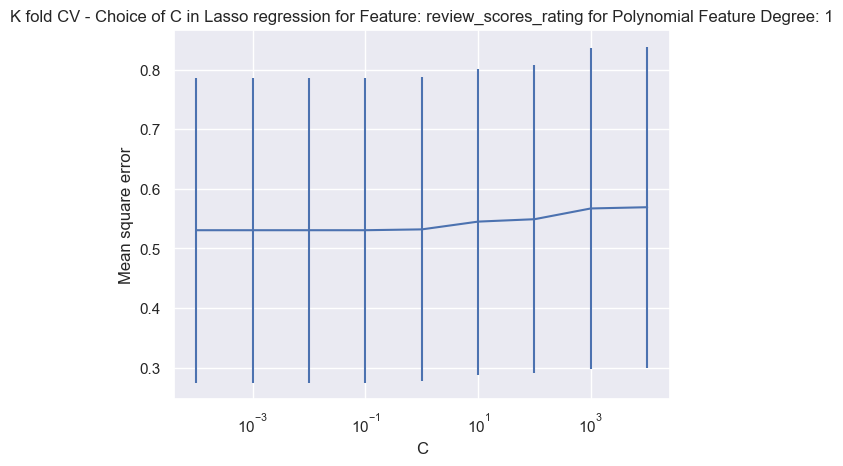

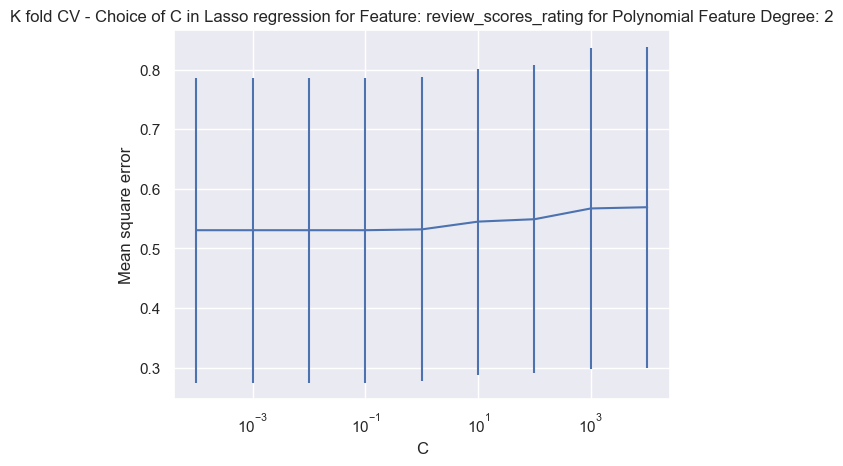

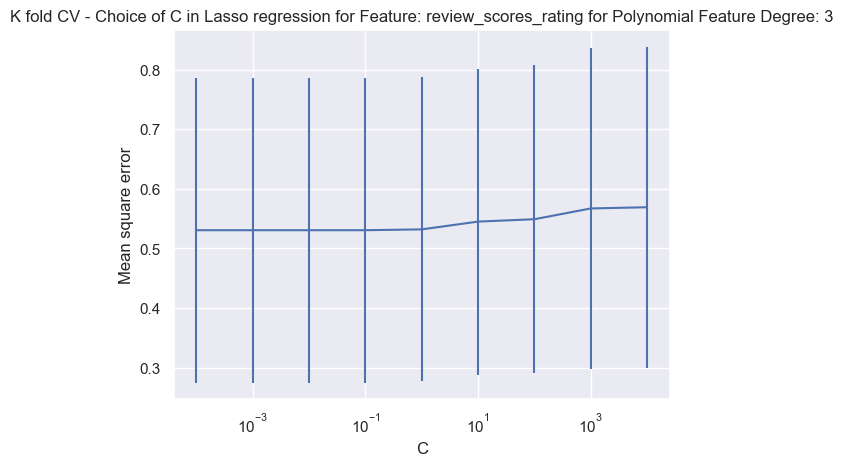

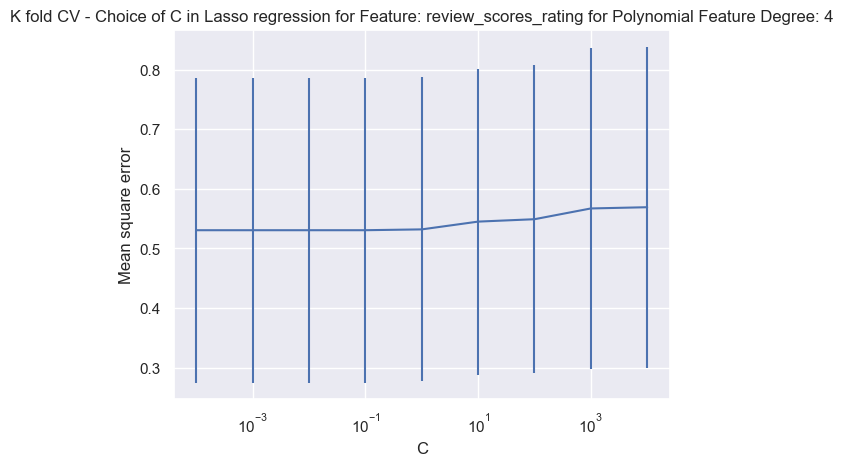

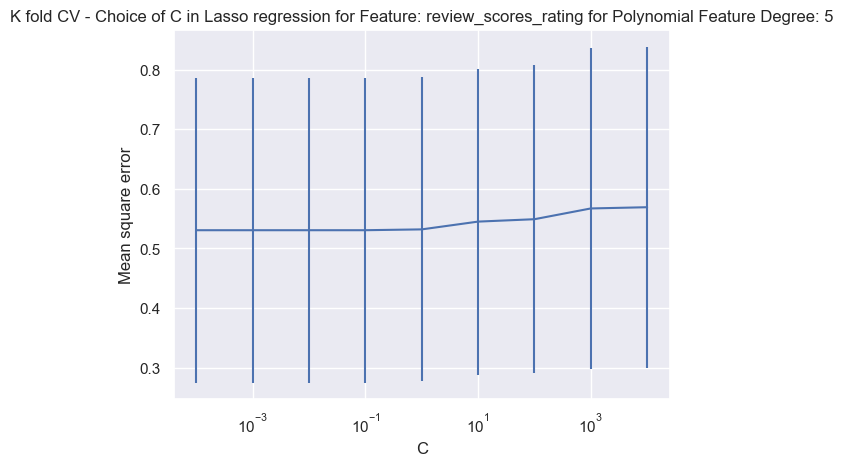

-------------------------------------
review_scores_accuracy


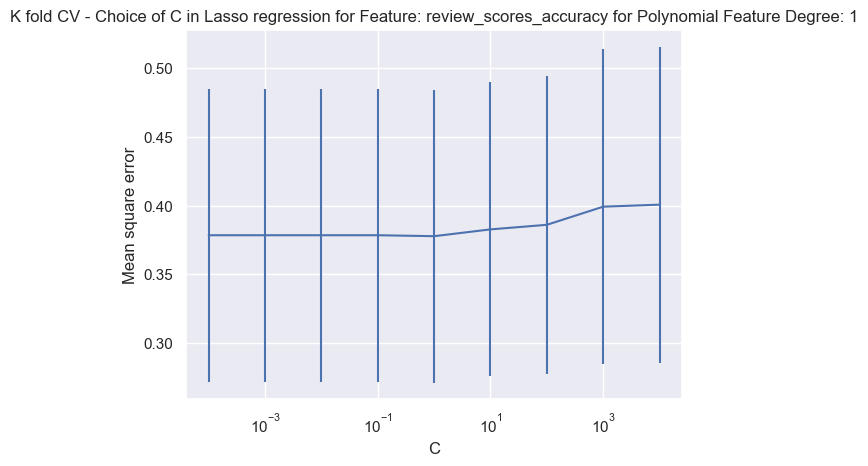

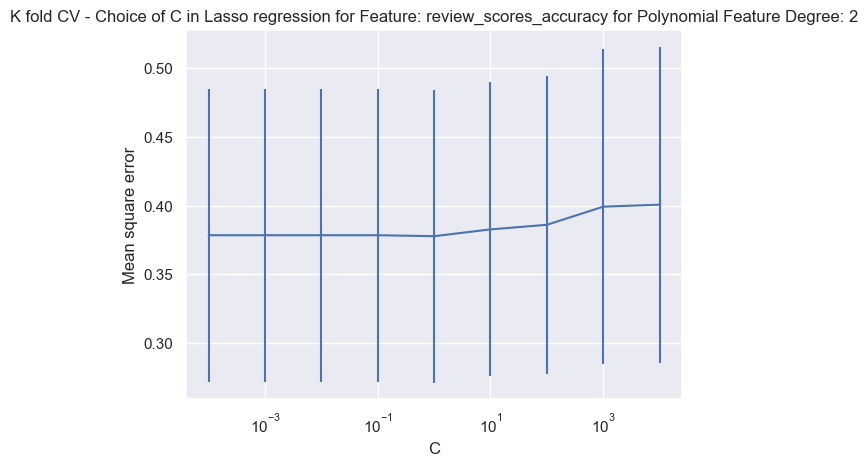

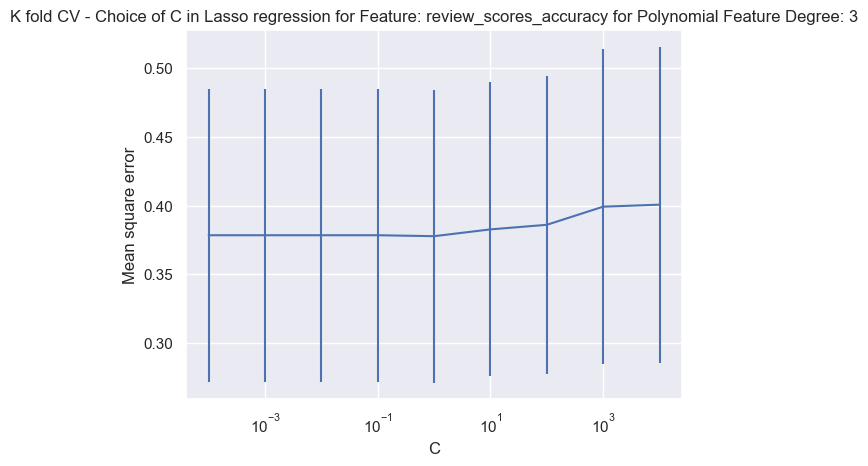

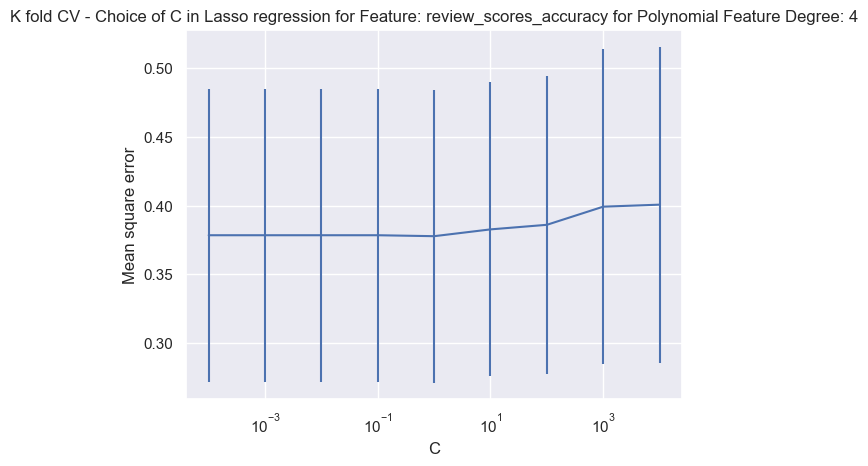

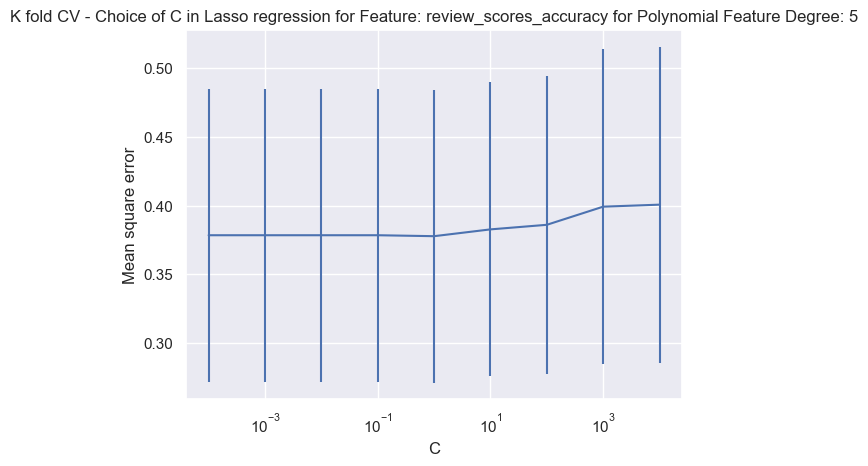

-------------------------------------
review_scores_cleanliness


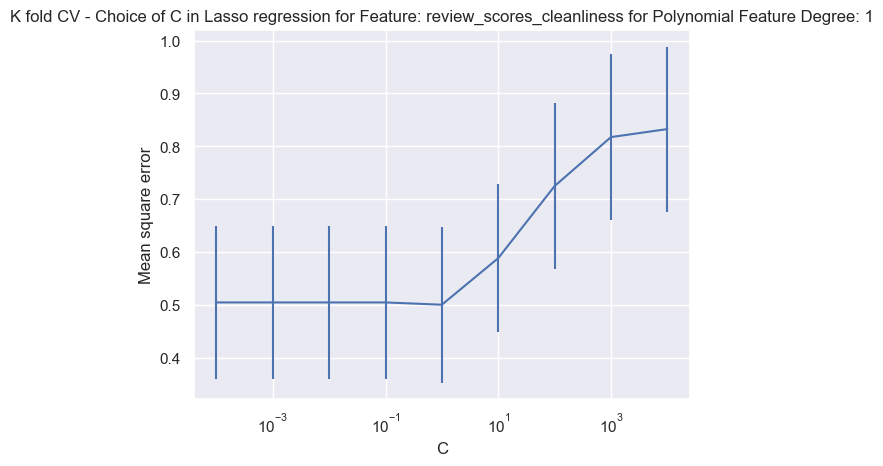

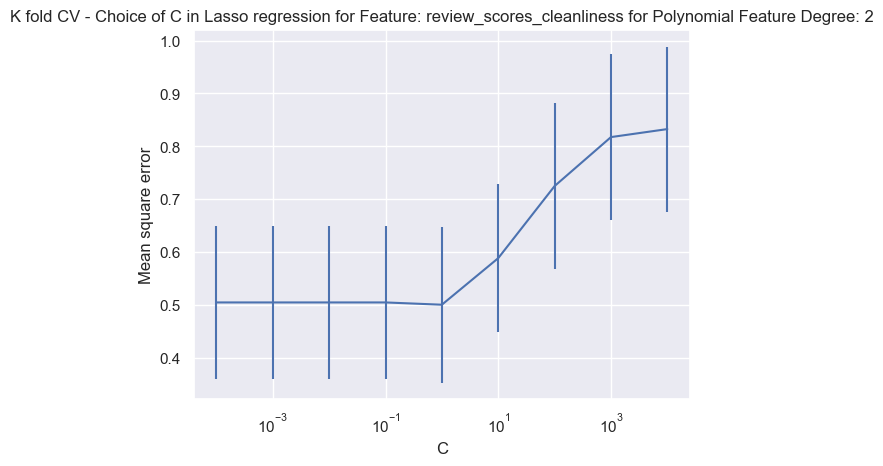

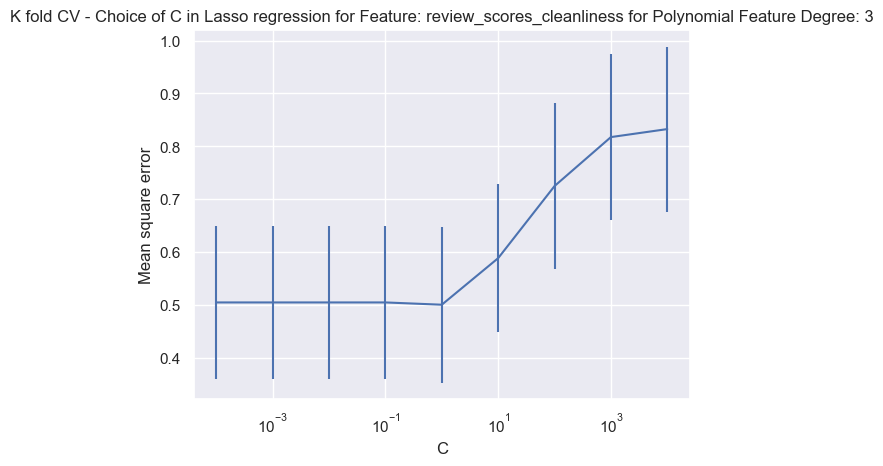

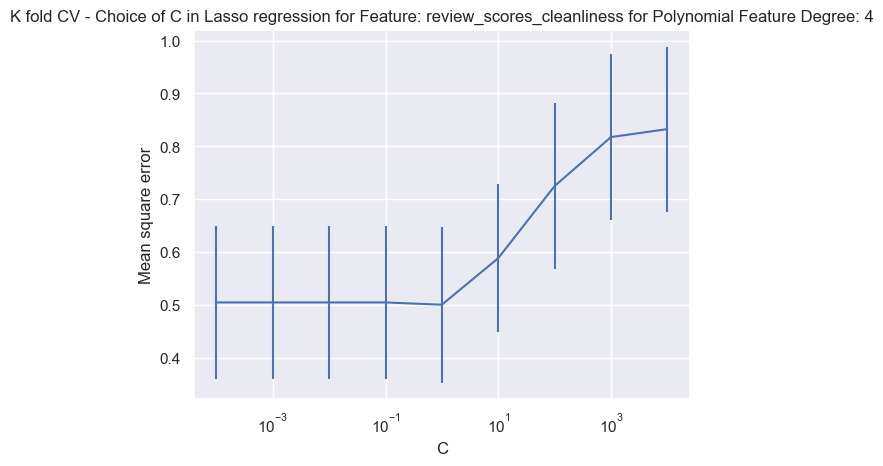

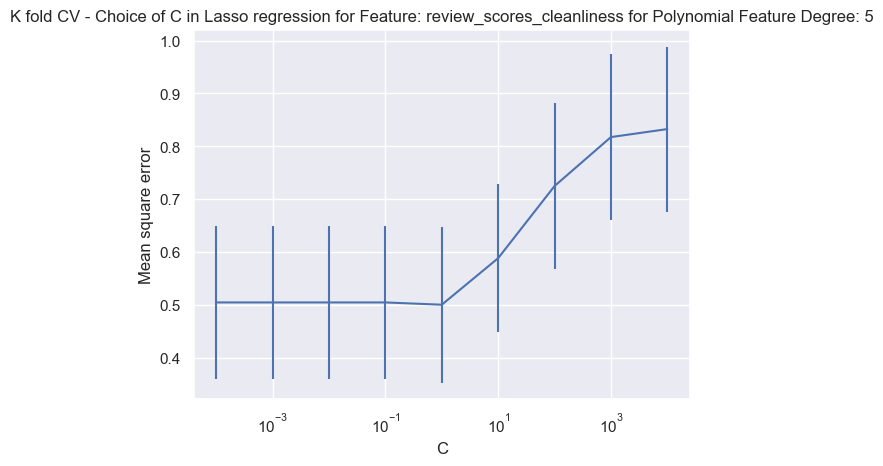

-------------------------------------
review_scores_checkin


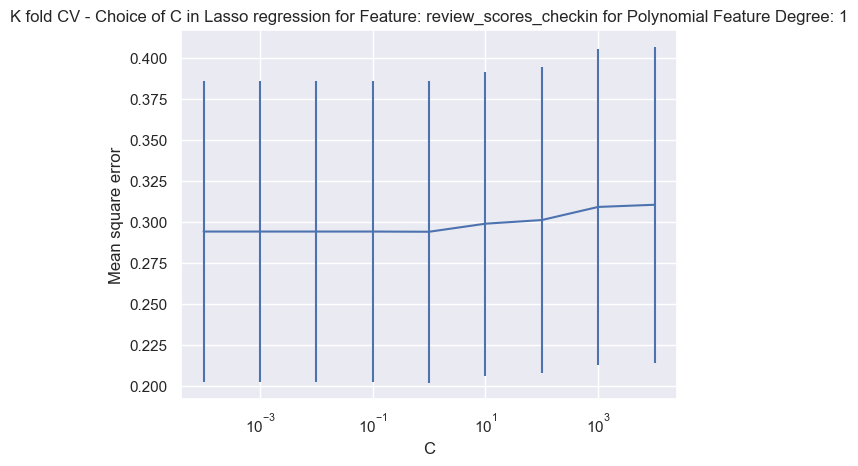

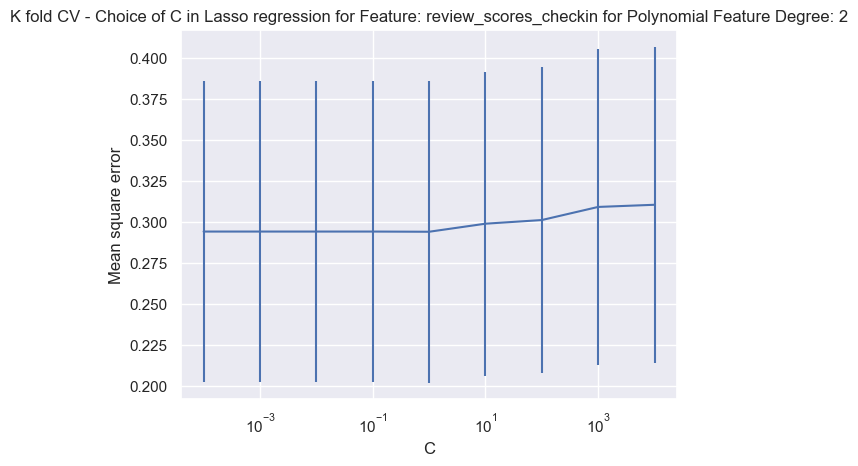

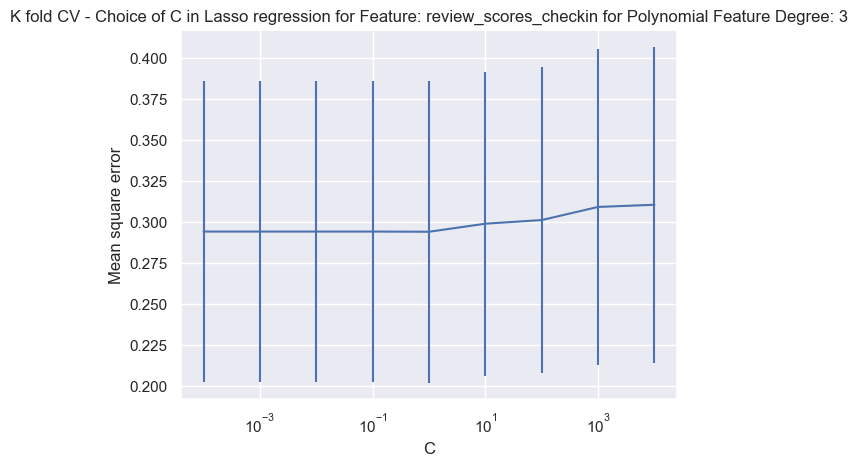

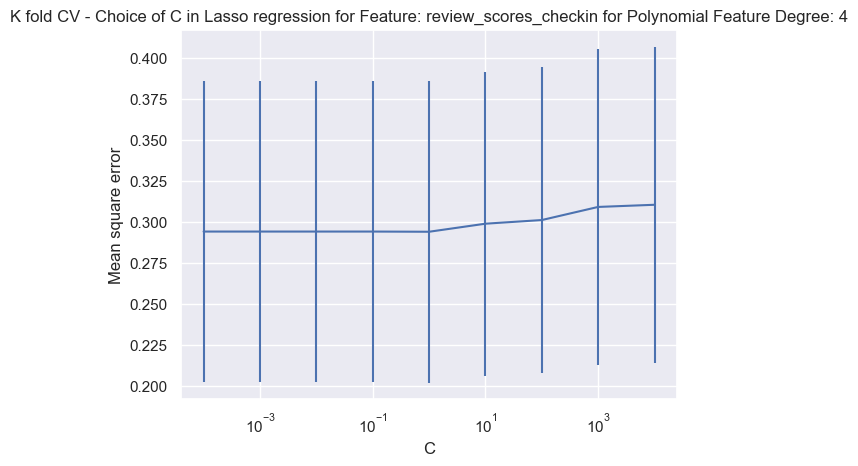

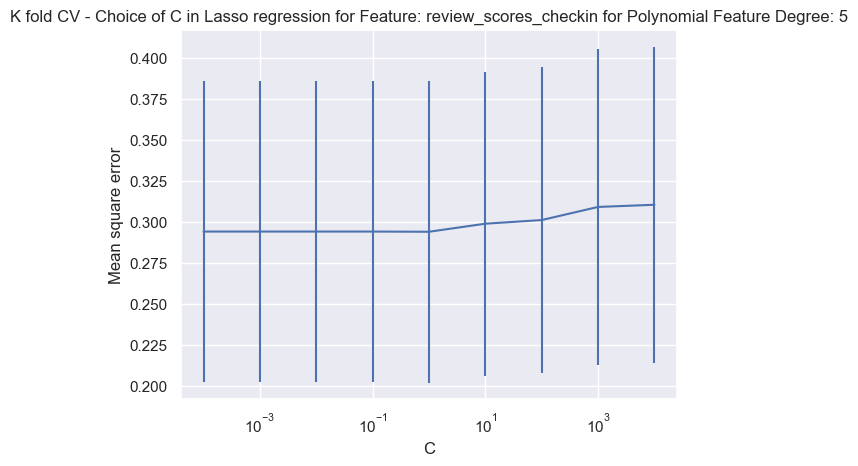

-------------------------------------
review_scores_communication


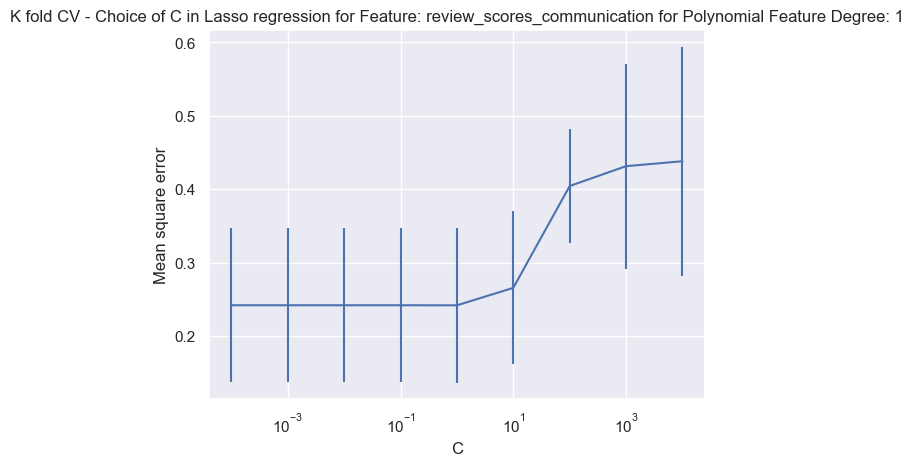

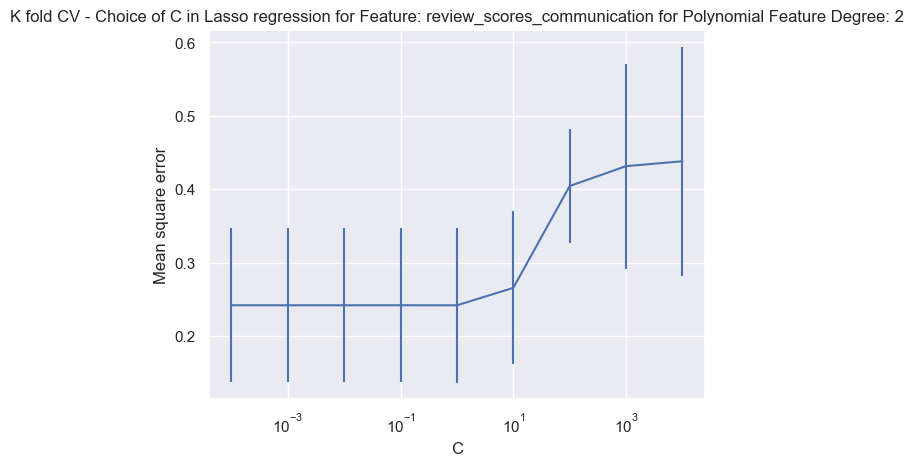

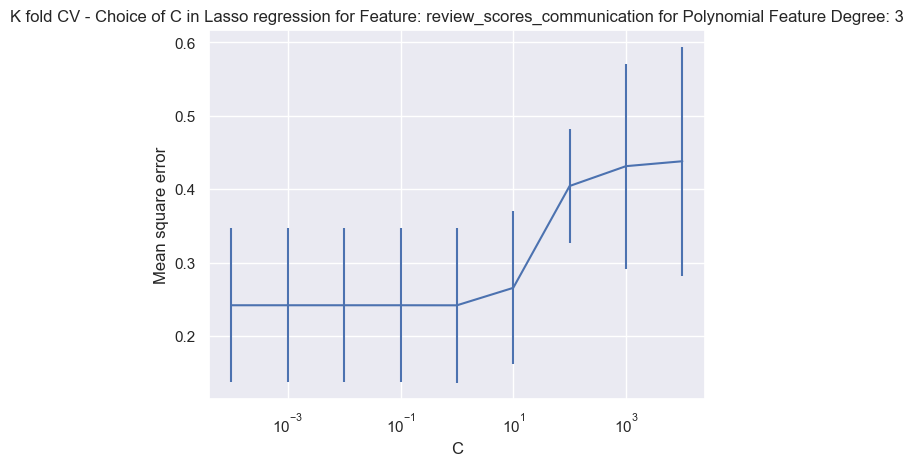

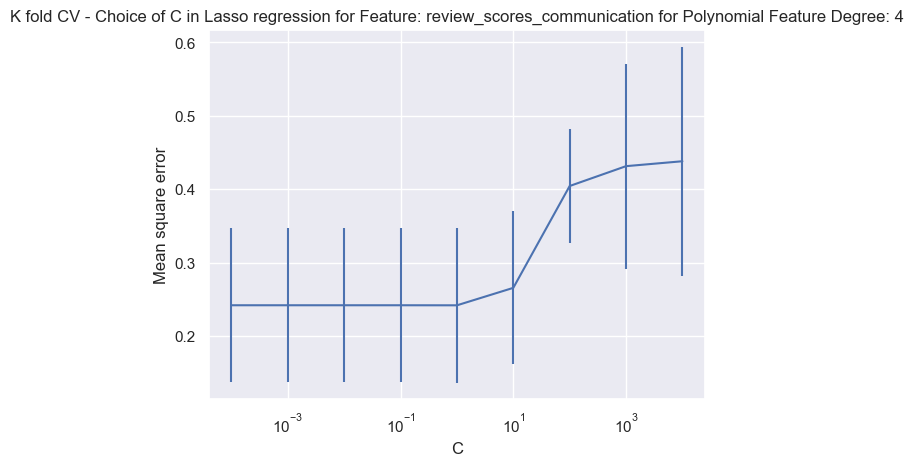

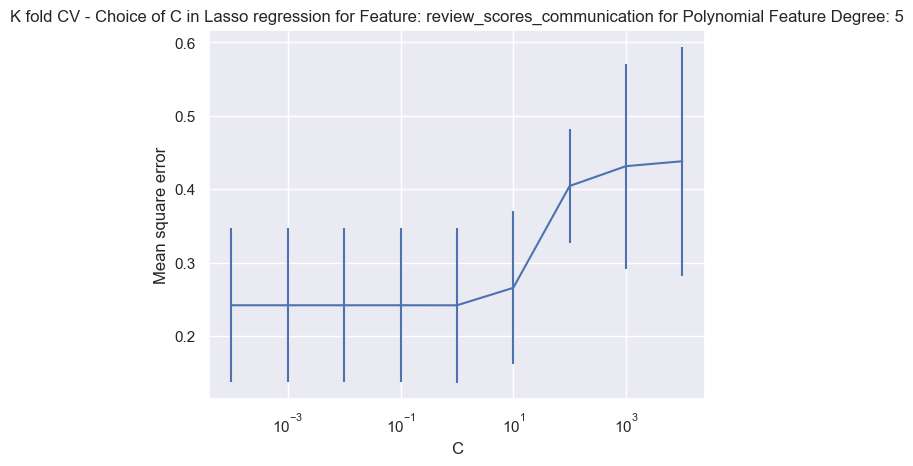

-------------------------------------
review_scores_location


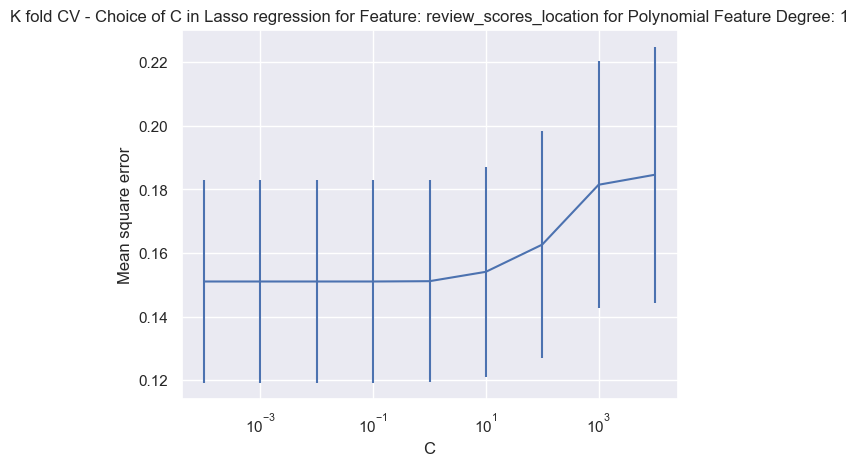

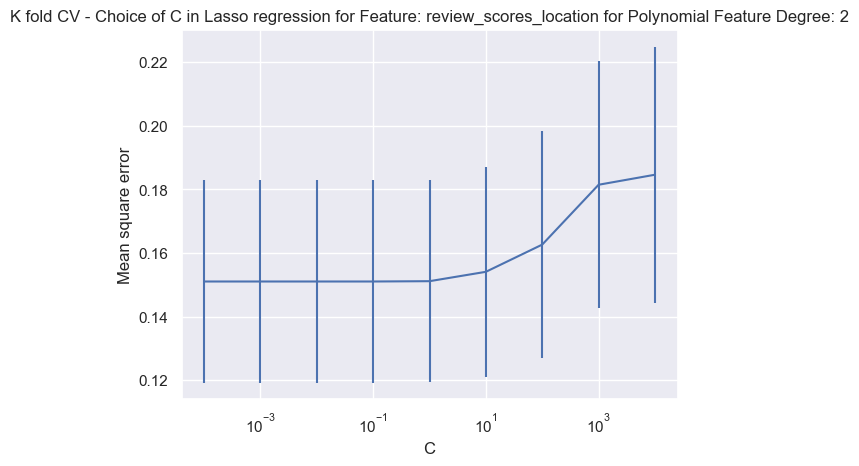

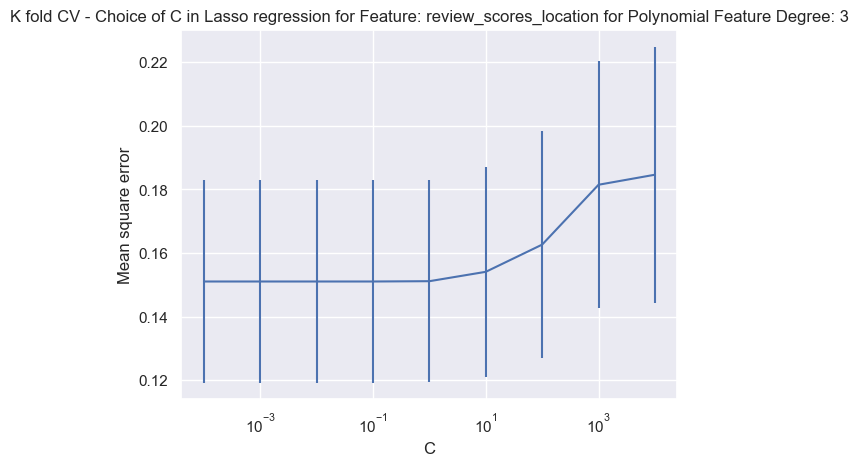

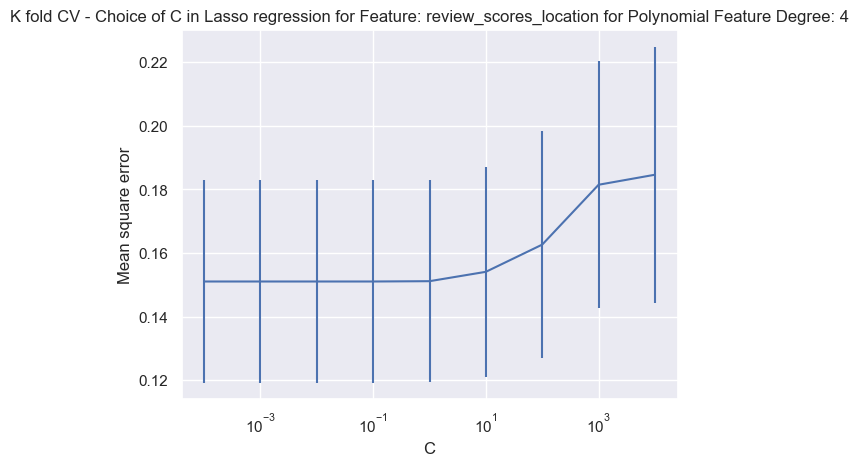

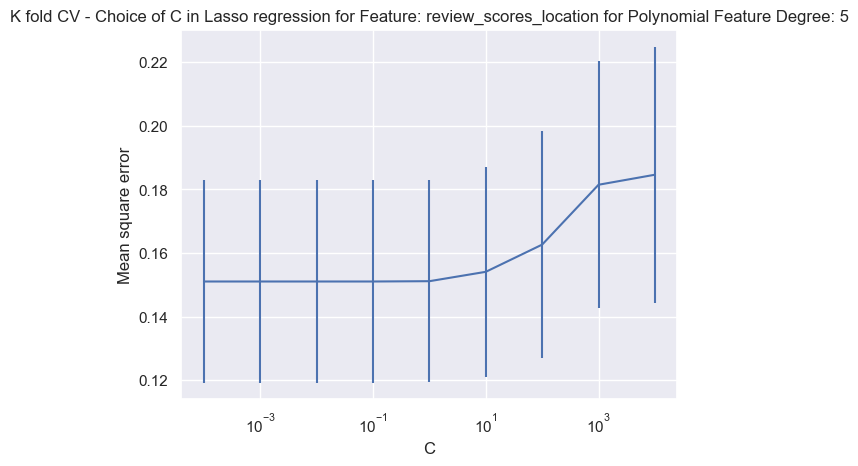

-------------------------------------
review_scores_value


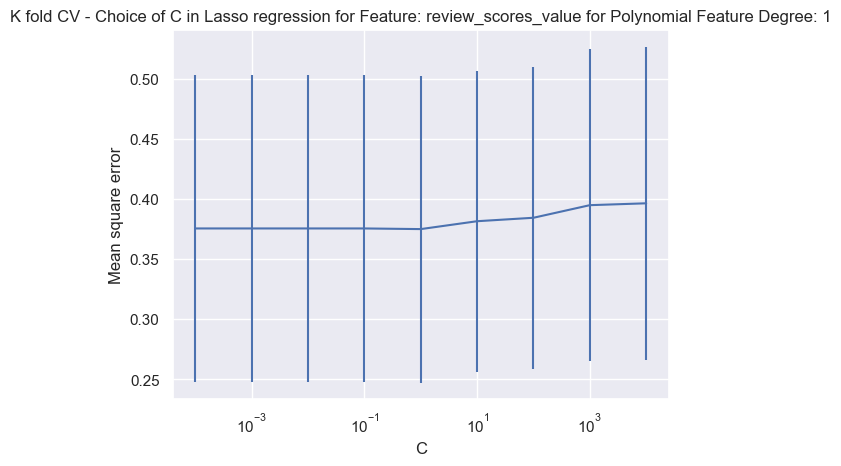

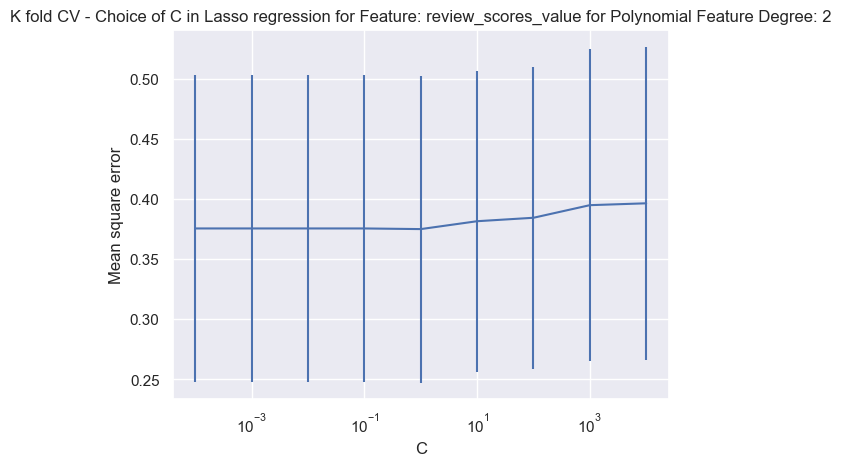

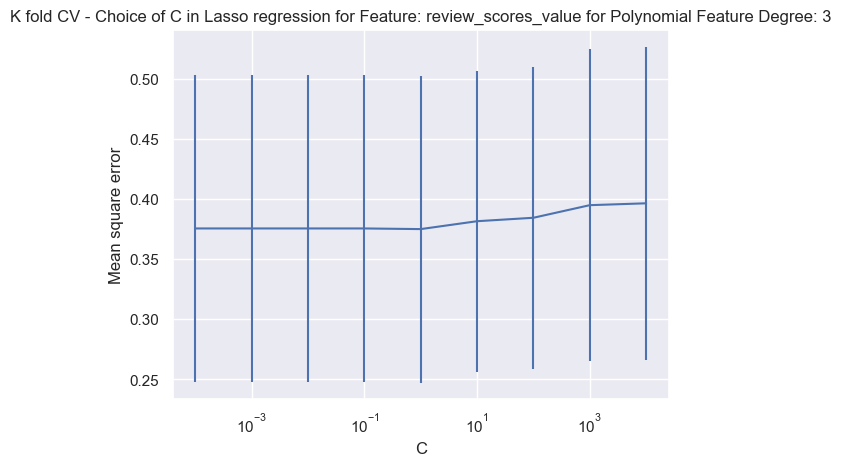

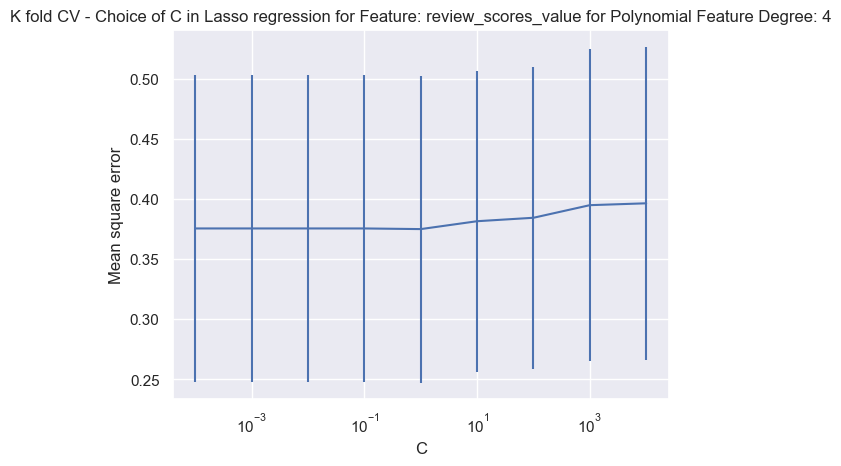

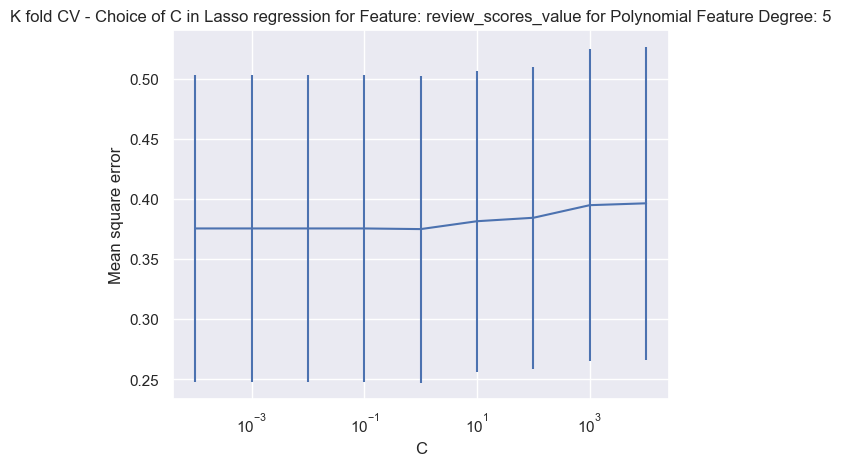

-------------------------------------


In [294]:
def kfcv(x,y,c_range,name_of_model,range_of_poly):
  for poly_degree in range_of_poly:
    mean_error=[];std_error=[];
    x_poly=PolynomialFeatures(poly_degree).fit_transform(x)
    # x_poly_test =PolynomialFeatures(poly_degree).fit_transform(x_test)
    for c in c_range:
      if(name_of_model=='Lasso'):
        model=Lasso(alpha=1/(2*c))
      elif(name_of_model=='Ridge'):
        model=Ridge(alpha=1/(2*c))
      
      mean_square_error_temp=[]
      kf=KFold(n_splits=5)
      for train,test in kf.split(x_test):
        model.fit(pd.DataFrame(x_test).iloc[train],pd.DataFrame(y).iloc[train])
        predictions=model.predict(pd.DataFrame(x).iloc[test])
        mean_square_error_temp.append(mean_squared_error(pd.DataFrame(y).iloc[test],predictions))
      mean_error.append(np.array(mean_square_error_temp).mean())
      std_error.append(np.array(mean_square_error_temp).std())
    plt.errorbar(c_range,mean_error,yerr=std_error)
    plt.xlabel('C'); plt.ylabel('Mean square error')
    plt.title(f'K fold CV - Choice of C in {name_of_model} regression for Feature: {y.columns[0]} for Polynomial Feature Degree: {poly_degree}')
    plt.xscale('log')
    plt.show()

c_vals=[0.0001,0.001,0.01,0.1,1,10,100,1000,10000]
range_of_poly = [1,2,3,4,5] 
model='Lasso'
    
for y in Y:
  # print(y.shape)
  features=topFeatures[y.columns[0]]
  fX=X.copy()
  fX=fX[[c for c in X.columns if c in features]]
  # poly_feature=5
  print(y.columns[0])
  kfcv(fX,y,c_vals,model,range_of_poly)
  print('-------------------------------------')
  # print('----------------------------------------------------')